In [94]:
import pandas as pd
import seaborn as sn
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [95]:
df=pd.read_csv('autombile_insurance_fraud.csv')
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


# EDA and Feature Engineering

In [96]:
df.shape

(1000, 40)

there are 1000 rows and 40 columns

In [97]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

there are several int and object datatype columns

In [98]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

above are the column names present in the dataset

In [99]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

in one column all the rows are empty c_39 hence we will remove it,here we can see in other columns there are no null values present but i saw on the dataset there are few columns with special character

In [100]:
df.drop('_c39',axis=1,inplace=True)

dropped the column

In [101]:
df.isin(['?']).sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

there are columns which consists of this special character police_report_available, property_damage, collision_type

In [102]:
df['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [103]:
df['collision_type'].mode()

0    Rear Collision
dtype: object

In [104]:
df['collision_type']=df['collision_type'].replace('?','Rear Collision')

replaced the special characyer value with the mode of the column

In [105]:
df['property_damage'].value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

here between yes and no maximum value is of no so we will replace it with that

In [106]:
df['property_damage'].mode()

0    ?
dtype: object

In [107]:
df['property_damage']=df['property_damage'].replace('?','NO')

In [108]:
df['police_report_available'].value_counts()

NO     343
?      343
YES    314
Name: police_report_available, dtype: int64

In [109]:
df['police_report_available']=df['police_report_available'].replace('?','NO')

replaced the special character with the mode value

In [110]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

now there are no null value present

In [111]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])

In [112]:
df['policy_bind_month']=df['policy_bind_date'].dt.month

In [113]:
df['policy_bind_year']=df['policy_bind_date'].dt.year

convereted the policy_bind_date into datetime and then made 2 new columns out of that policy_bind_month and policy_bind_year

In [114]:
df.drop('policy_bind_date',axis=1,inplace=True)

dropped the column

In [115]:
a=df.describe(include=['O']).columns

saved all the object datatypes in a variable

In [116]:
for i in a:
    print(i)
    print(df[i].value_counts())
    print('\n')

policy_state
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


policy_csl
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


insured_sex
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


insured_hobbies
reading           64
exercise          57
paintball         57
bungie-jumping    56
golf              55
movies            55
camping        

we have to drop incident_location column as it has all different kind of data in all rows

In [117]:
df.drop('incident_location',axis=1,inplace=True)

In [118]:
a=df.select_dtypes('object').columns.tolist()

In [119]:
df['incident_date']=pd.to_datetime(df['incident_date'])
df['incident_date_month']=df['incident_date'].dt.month

changing the incident_date column into datetime and extracting the month from it and making a new column incident_date_month, and then will drop the incident_date column

In [120]:
df.drop('incident_date',axis=1,inplace=True)

In [121]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_state                 1000 non-null   object 
 4   policy_csl                   1000 non-null   object 
 5   policy_deductable            1000 non-null   int64  
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   int64  
 8   insured_zip                  1000 non-null   int64  
 9   insured_sex                  1000 non-null   object 
 10  insured_education_level      1000 non-null   object 
 11  insured_occupation           1000 non-null   object 
 12  insured_hobbies              1000 non-null   object 
 13  insured_relationshi

these are the information of our new added columns with other columns with no null values

In [122]:
a=df.describe(include=['O']).columns

saving again the object datatype columns in a variable

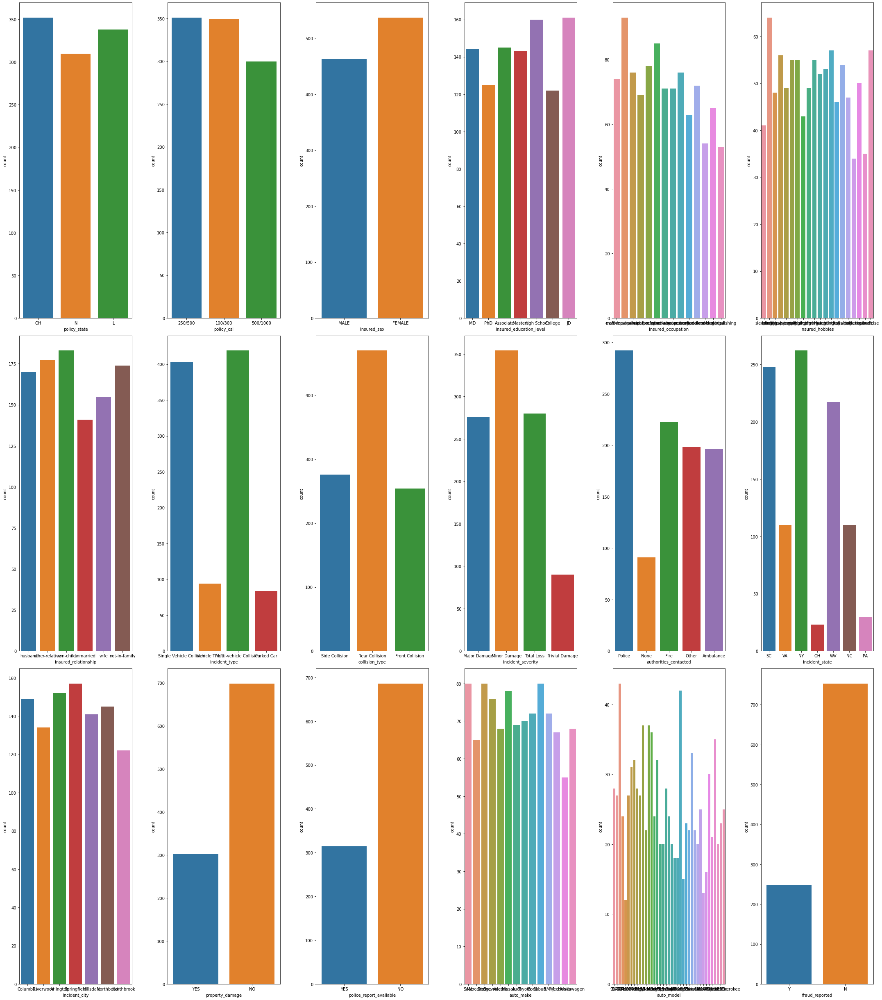

In [31]:
plt.figure(figsize=(30,34))
for i in range(len(a)):
    plt.subplot(3,6,i+1)
    sn.countplot(df[a[i]])
    plt.tight_layout()

OH has the highest policy.

own child relationship are more insured.

springfield is at no.1 in incident_city

max people doesnt have property damage

multi vehicle collision is the maximum incident_type

max people have no police report availability

rear collision is the max collision type

max count is of female

school and JD education level are max at insured level

max people has minor damage at incident severity

fraud reported column is our target variable and it is imabalanced we have to balance it






In [123]:
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
LB = LabelEncoder()
for i in a:
    df[i]=LB.fit_transform(df[i])
df.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_date_month
0,328,48,521585,2,1,1000,1406.91,0,466132,1,...,6510,13020,52080,10,1,2004,1,10,2014,1
1,228,42,342868,1,1,2000,1197.22,5000000,468176,1,...,780,780,3510,8,12,2007,1,6,2006,1
2,134,29,687698,2,0,2000,1413.14,5000000,430632,0,...,7700,3850,23100,4,30,2007,0,6,2000,2
3,256,41,227811,0,1,2000,1415.74,6000000,608117,0,...,6340,6340,50720,3,34,2014,1,5,1990,10
4,228,44,367455,0,2,1000,1583.91,6000000,610706,1,...,1300,650,4550,0,31,2009,0,6,2014,2


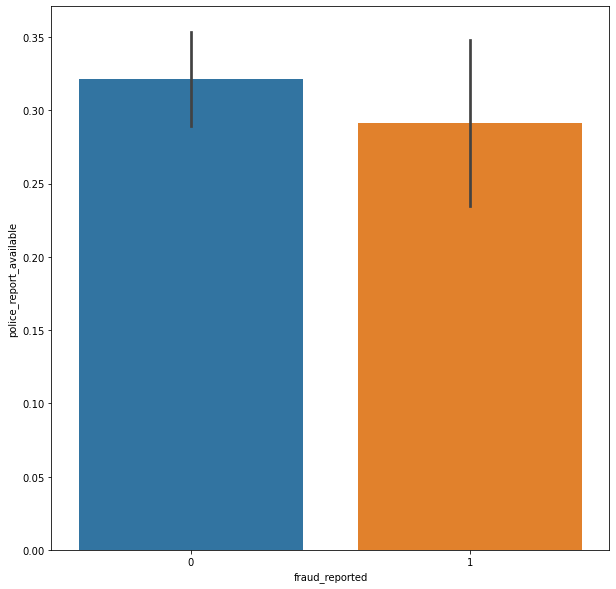

In [125]:
plt.figure(figsize=[10,10])
sn.barplot(df['fraud_reported'],df['police_report_available']);

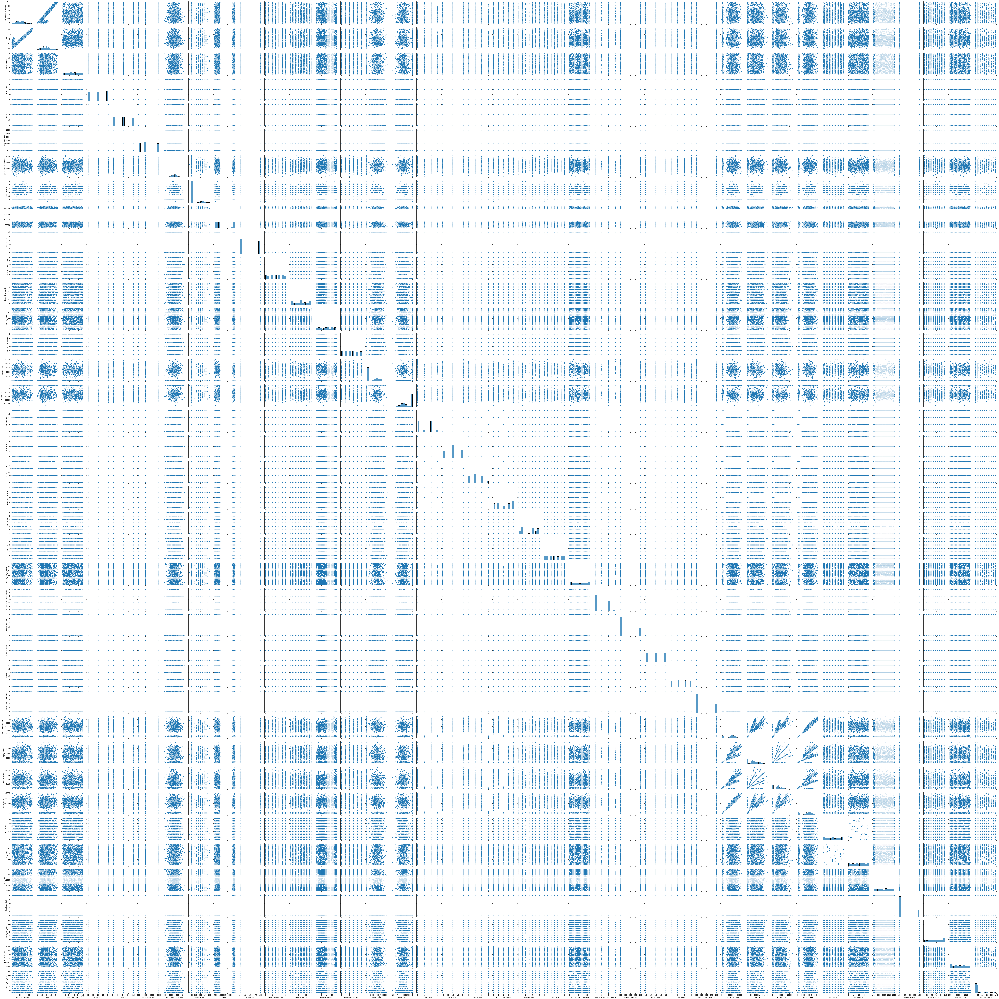

In [128]:
sn.pairplot(df)

months as customer and age has a linear relation,springfield is at no.1 in incident_city,max people doesnt have property damage
,multi vehicle collision is the maximum incident_type
,max people have no police report availability



<AxesSubplot:>

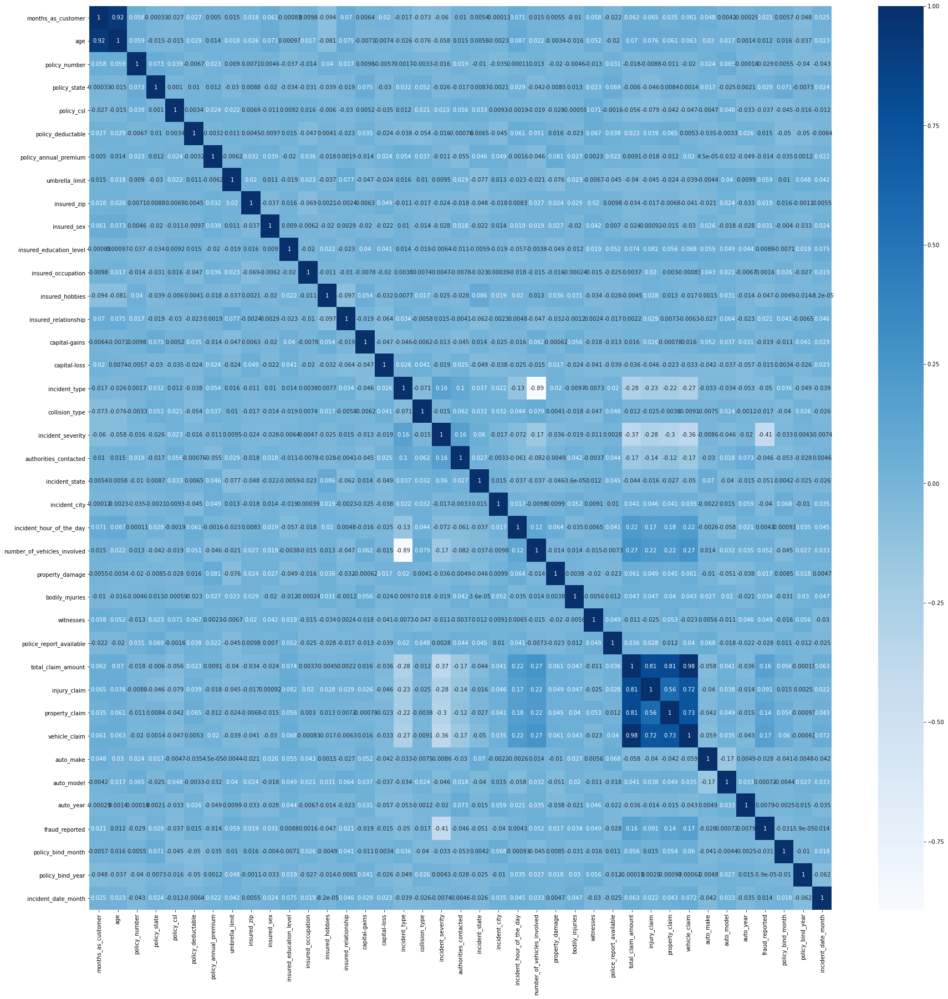

In [33]:
df_correlation=df.corr()
plt.figure(figsize=(30,30))
sn.heatmap(df_correlation,cmap='Blues',annot=True)

max correlation is with vehicle claim and least is with incident_severity

total_claim_amount and vehicle claim amout is highly correlated

months_as_customer                AxesSubplot(0.125,0.816017;0.168478x0.0639831)
age                            AxesSubplot(0.327174,0.816017;0.168478x0.0639831)
policy_number                  AxesSubplot(0.529348,0.816017;0.168478x0.0639831)
policy_state                   AxesSubplot(0.731522,0.816017;0.168478x0.0639831)
policy_csl                        AxesSubplot(0.125,0.739237;0.168478x0.0639831)
policy_deductable              AxesSubplot(0.327174,0.739237;0.168478x0.0639831)
policy_annual_premium          AxesSubplot(0.529348,0.739237;0.168478x0.0639831)
umbrella_limit                 AxesSubplot(0.731522,0.739237;0.168478x0.0639831)
insured_zip                       AxesSubplot(0.125,0.662458;0.168478x0.0639831)
insured_sex                    AxesSubplot(0.327174,0.662458;0.168478x0.0639831)
insured_education_level        AxesSubplot(0.529348,0.662458;0.168478x0.0639831)
insured_occupation             AxesSubplot(0.731522,0.662458;0.168478x0.0639831)
insured_hobbies             

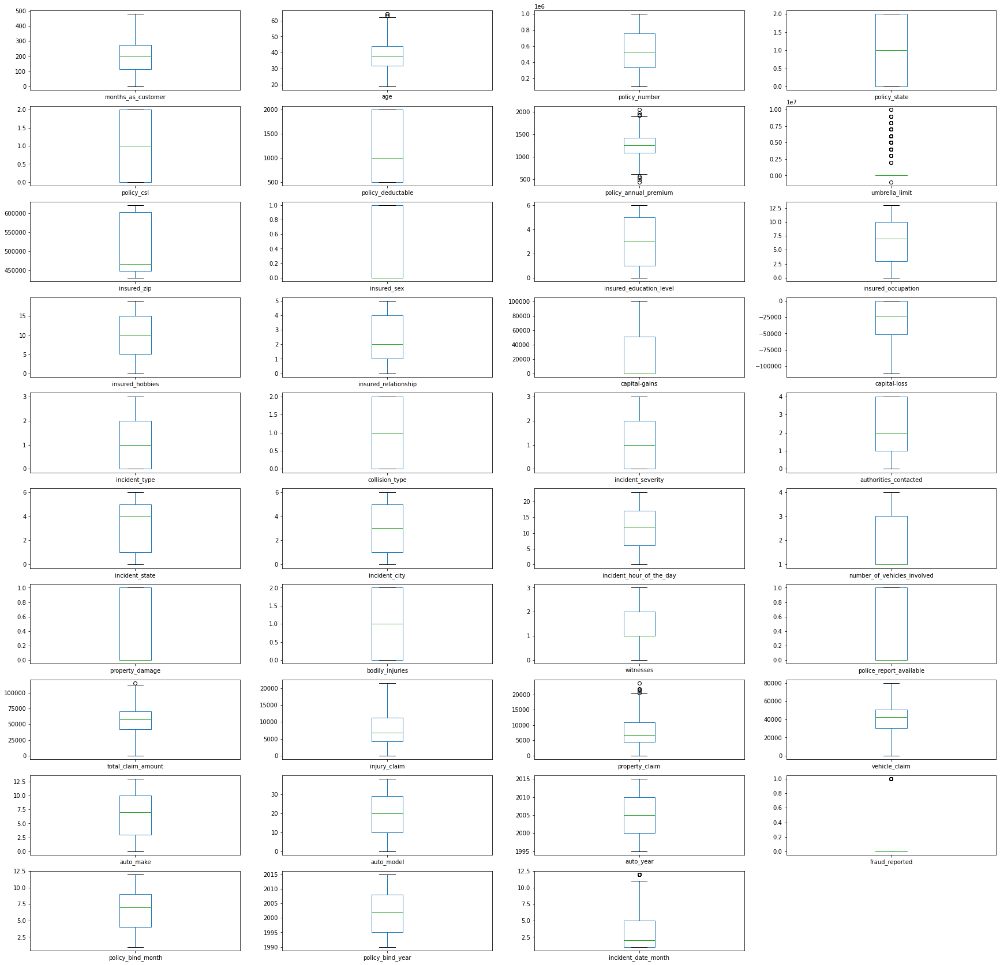

In [130]:
df.plot(kind='box',subplots=True,layout=(10,4),figsize=(30,30))

there are certain outliers present in property claim incident date month umbrella limit policy annual premium

In [35]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(df):
    vif=pd.DataFrame()
    vif["variables"]=df.columns
    vif["VIF FACTOR"]=[variance_inflation_factor(df.values,i) for i in range(df.shape[1])]
    return(vif)

calc_vif(df)

,variables,VIF FACTOR
0,months_as_customer,2.838313e+01
1,age,1.315623e+02
2,policy_number,5.692987e+00
3,policy_state,2.603315e+00
4,policy_csl,2.469043e+00
5,policy_deductable,4.634750e+00
6,policy_annual_premium,2.858536e+01
7,umbrella_limit,1.277455e+00
8,insured_zip,5.120847e+01
9,insured_sex,1.911828e+00


multicollinearity is not that high in any of the columns

In [36]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 7,  7,  7,  7,  7,  6,  6,  7,  7,  7,  7, 30,  7,  7,  7,  6, 15,
         7,  7,  7], dtype=int64))

In [37]:
df_new=df[(z<3).all(axis=1)]
df_new.head()
df_new.shape

(980, 39)

In [38]:
df.shape

(1000, 39)

In [39]:
data_loss=((1000-980)/1000)*100
data_loss

2.0

after removing the outliers data loss is only 2% we will remove the outliers

In [40]:
x=df_new.drop('fraud_reported',axis=1)
y=df_new['fraud_reported']
print(x.shape)
print(y.shape)

(980, 38)
(980,)


x and y splitting

In [41]:
x.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725
property_damage                0.853093


In [42]:
x['total_claim_amount']=np.sqrt(x['total_claim_amount'])

removed the skewness from all the columns

# Scaling

In [43]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=scaler.fit_transform(x)
x=pd.DataFrame(x)
x.head()

,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
0,1.069568,0.983352,-0.095774,1.179821,0.067231,-0.224643,0.620031,-0.467878,-0.484014,1.071971,...,0.681515,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594,1.013473,1.683157,-0.733396
1,0.202726,0.329711,-0.790245,-0.024580,0.067231,1.412161,-0.248448,1.890767,-0.455363,1.071971,...,-1.985818,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476,-0.162612,0.600279,-0.733396
2,-0.612105,-1.086511,0.549720,1.179821,-1.175916,1.412161,0.645834,1.890767,-0.981629,-0.932861,...,-0.424760,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476,-0.162612,-0.211879,-0.427163
3,0.445442,0.220771,-1.237342,-1.228980,0.067231,1.412161,0.656603,2.362496,1.506233,-0.932861,...,0.466836,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975,-0.456633,-1.565477,2.022697
4,0.202726,0.547591,-0.694703,-1.228980,1.310379,-0.224643,1.353117,2.362496,1.542524,1.071971,...,-1.857900,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190,-0.162612,1.683157,-0.427163


scaled the data

# PCA

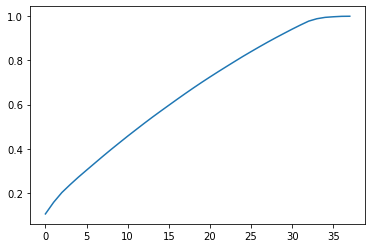

In [44]:
from sklearn.decomposition import PCA
pca=PCA()
pc=pca.fit_transform(x)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

we can see that at 33 component it has 95% of variance we will reduce it to 33

In [45]:
pca=PCA(n_components=33)
df_new=pca.fit_transform(x)
x=pd.DataFrame(df_new)
x.head()

,0,1,2,3,4,5,6,7,8,9,...,23,24,25,26,27,28,29,30,31,32
0,0.798820,0.956555,-1.165064,-3.009205,-0.175593,0.034301,-0.781697,-0.578797,0.498724,0.124598,...,1.175452,0.051934,-0.196718,-0.615263,-0.653400,-0.642653,-0.506645,-1.250446,0.275642,-0.439563
1,-3.799419,0.716939,-0.247250,0.030657,0.022418,0.226711,0.716222,1.068498,-0.632668,0.145623,...,-0.228184,0.831616,-0.704980,0.443093,0.534973,0.761650,-1.459998,-0.267789,0.487346,0.402421
2,-0.488149,-0.866056,1.579760,2.087103,-0.969373,0.328881,-0.597057,0.423566,0.853562,1.060056,...,1.245072,-0.137080,-0.483330,0.265268,1.005642,-0.499571,0.031969,0.724416,-0.728432,1.746587
3,0.128526,1.225127,-0.841705,3.091319,-1.416841,2.274528,-0.511674,0.476832,1.306481,2.439579,...,0.899586,1.118267,-0.946647,-0.662311,-2.006041,-0.156934,0.689386,-0.560171,-0.688324,1.128946
4,-3.249185,1.279578,0.130867,2.746484,0.585700,-0.899631,-1.285200,0.277231,0.859599,-0.512635,...,-0.585482,2.807264,0.951835,-1.083985,-1.344255,0.551476,0.096566,-0.008680,0.218697,0.477803


reduced columns to 33

# Sampling

In [46]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
trainx,trainy=smt.fit_resample(x,y)
trainx.value_counts()
trainy.value_counts()

0    740
1    740
Name: fraud_reported, dtype: int64

balanced the imbalanced data

In [47]:
x=pd.DataFrame(trainx)
y=pd.DataFrame(trainy)

# Training and Testing of model

In [48]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [49]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=i)
    a=DecisionTreeClassifier()
    a.fit(x_train,y_train)
    pred=a.predict(x_test)
    accu=accuracy_score(y_test,pred)
    if accu>maxAccu:
        maxAccu=accu
        maxRS=i
print("best accuracy is",maxAccu,"on random state",maxRS)

best accuracy is 0.7709611451942741 on random state 190


In [50]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=190)

In [51]:
a.fit(x_train,y_train)
a.score(x_train,y_train)
predm=a.predict(x_test)
print('accuracy score of' ,a, 'is:')
print(accuracy_score(y_test,predm))
print(confusion_matrix(y_test,predm))
print(classification_report(y_test,predm))
print('\n')

accuracy score of DecisionTreeClassifier() is:
0.754601226993865
[[175  71]
 [ 49 194]]
              precision    recall  f1-score   support

           0       0.78      0.71      0.74       246
           1       0.73      0.80      0.76       243

    accuracy                           0.75       489
   macro avg       0.76      0.75      0.75       489
weighted avg       0.76      0.75      0.75       489





In [52]:
from sklearn.model_selection import cross_val_score
c=cross_val_score(a,x,y,cv=5).mean()
print("the cross val score of",a,"is: ",c)

the cross val score of DecisionTreeClassifier() is:  0.7270270270270272


In [53]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=i)
    a=RandomForestClassifier()
    a.fit(x_train,y_train)
    pred=a.predict(x_test)
    accu=accuracy_score(y_test,pred)
    if accu>maxAccu:
        maxAccu=accu
        maxRS=i
print("best accuracy is",maxAccu,"on random state",maxRS)

best accuracy is 0.9100204498977505 on random state 119


In [70]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=119)

In [55]:
a.fit(x_train,y_train)
a.score(x_train,y_train)
predm=a.predict(x_test)
print('accuracy score of' ,a, 'is:')
print(accuracy_score(y_test,predm))
print(confusion_matrix(y_test,predm))
print(classification_report(y_test,predm))
print('\n')

accuracy score of RandomForestClassifier() is:
0.8916155419222904
[[223  34]
 [ 19 213]]
              precision    recall  f1-score   support

           0       0.92      0.87      0.89       257
           1       0.86      0.92      0.89       232

    accuracy                           0.89       489
   macro avg       0.89      0.89      0.89       489
weighted avg       0.89      0.89      0.89       489





In [56]:
from sklearn.model_selection import cross_val_score

c=cross_val_score(a,x,y,cv=5).mean()
print("the cross val score of",a,"is: ",c)

the cross val score of RandomForestClassifier() is:  0.8952702702702704


In [57]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=i)
    a=LogisticRegression()
    a.fit(x_train,y_train)
    pred=a.predict(x_test)
    accu=accuracy_score(y_test,pred)
    if accu>maxAccu:
        maxAccu=accu
        maxRS=i
print("best accuracy is",maxAccu,"on random state",maxRS)

best accuracy is 0.7709611451942741 on random state 107


In [59]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=107)

In [60]:
a.fit(x_train,y_train)
a.score(x_train,y_train)
predm=a.predict(x_test)
print('accuracy score of' ,a, 'is:')
print(accuracy_score(y_test,predm))
print(confusion_matrix(y_test,predm))
print(classification_report(y_test,predm))
print('\n')

accuracy score of LogisticRegression() is:
0.7709611451942741
[[180  68]
 [ 44 197]]
              precision    recall  f1-score   support

           0       0.80      0.73      0.76       248
           1       0.74      0.82      0.78       241

    accuracy                           0.77       489
   macro avg       0.77      0.77      0.77       489
weighted avg       0.77      0.77      0.77       489





In [61]:
from sklearn.model_selection import cross_val_score

c=cross_val_score(a,x,y,cv=5).mean()
print("the cross val score of",a,"is: ",c)

the cross val score of LogisticRegression() is:  0.7189189189189189


In [62]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=i)
    a=KNeighborsClassifier()
    a.fit(x_train,y_train)
    pred=a.predict(x_test)
    accu=accuracy_score(y_test,pred)
    if accu>maxAccu:
        maxAccu=accu
        maxRS=i
print("best accuracy is",maxAccu,"on random state",maxRS)

best accuracy is 0.6871165644171779 on random state 124


In [63]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=124)

In [64]:
a.fit(x_train,y_train)
a.score(x_train,y_train)
predm=a.predict(x_test)
print('accuracy score of' ,a, 'is:')
print(accuracy_score(y_test,predm))
print(confusion_matrix(y_test,predm))
print(classification_report(y_test,predm))
print('\n')

accuracy score of KNeighborsClassifier() is:
0.6871165644171779
[[ 86 142]
 [ 11 250]]
              precision    recall  f1-score   support

           0       0.89      0.38      0.53       228
           1       0.64      0.96      0.77       261

    accuracy                           0.69       489
   macro avg       0.76      0.67      0.65       489
weighted avg       0.75      0.69      0.66       489





In [65]:
from sklearn.model_selection import cross_val_score
c=cross_val_score(a,x,y,cv=5).mean()
print("the cross val score of",a,"is: ",c)

the cross val score of KNeighborsClassifier() is:  0.652027027027027


after seeing the model performance and the cross val score least difference between the two is in Randomforestclassifier. we will choose it as our model

# Hyperparameter Tuning

In [71]:
from sklearn.model_selection import GridSearchCV
import numpy as np

In [72]:
parameter={'max_features':['auto','sqrt','log2'],
          'min_samples_split':np.arange(0,10),
          'max_depth':np.arange(0,10),
          'min_samples_leaf':np.arange(0,10)}

In [73]:
GCV=GridSearchCV(RandomForestClassifier(),parameter,cv=10)

In [74]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(),
             param_grid={'max_depth': array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_split': array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])})

In [75]:
GCV.best_params_

{'max_depth': 9,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 8}

In [82]:
fraud_mod=RandomForestClassifier(max_features='auto',max_depth=9,min_samples_leaf=2,min_samples_split=8)
fraud_mod.fit(x_train,y_train)
pred=fraud_mod.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

88.5480572597137


after hyperparameter tuning the accuracy score is 88.54%

# AUC-ROC

In [84]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

In [85]:
y_pred_prob=fraud_mod.predict_proba(x_test)[:,1]

In [86]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

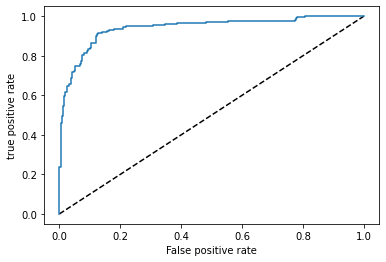

In [87]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='RandomForestClassifier')
plt.xlabel('False positive rate')
plt.ylabel('true positive rate')
plt.show()

as we can see the graph is little far from 1 as our score is less than 1

In [89]:
auc_score=roc_auc_score(y_test,fraud_mod.predict(x_test))
print(auc_score)

0.8870672883402657


auc score is almost similar to the accuracy score as its 88.70%

# Saving model

In [129]:
import joblib
joblib.dump(fraud_mod,"fraudmodel.pkl")

['fraudmodel.pkl']